# Servir et surveiller les modèles 

Dans ce chapitre, nous réfléchirons à la nécessité de servir et de surveiller les modèles d'apprentissage automatique (ML) en production et d'explorer différents moyens de servir les modèles de ML pour les utilisateurs ou les consommateurs du modèle. Ensuite, nous allons revoir le cadre de surveillance explicable du chapitre 11, Principes clés pour surveiller votre système de ML, et l'implémenter pour le cas d'utilisation commerciale que nous avons résolu à l'aide de MLOps pour prédire la météo. 

La mise en œuvre d'un cadre de suivi explicable est pratique. Nous déduirons l'API déployée et surveillerons et analyserons les données d'inférence à l'aide de drives (telles que drive data, feature drive et model drive) pour mesurer les performances d'un système ML. Enfin, nous examinerons plusieurs concepts pour régir les systèmes de ML pour les performances robustes des systèmes de ML afin de favoriser l'apprentissage et la livraison continus. 

Commençons par réfléchir à la nécessité de surveiller le ML en production. Ensuite, nous passerons à l'exploration des sujets suivants dans ce chapitre :

* Servir, surveiller et maintenir les modèles en production
* Explorer les différents modes de service des modèles de ML
* Mettre en œuvre le cadre de surveillance explicable
* Gouverner votre système de ML

## Servir, surveiller et maintenir des modèles en production

il ne sert à rien de déployer un modèle ou un système de ML et de ne pas le surveiller. La surveillance des performances est l'un des aspects les plus importants d'un système de ML. Le suivi nous permet d'analyser et de cartographier l'impact commercial qu'un système de ML offre aux parties prenantes de manière qualitative et quantitative. Afin d'obtenir un impact commercial maximal, les utilisateurs de systèmes de ML doivent être servis de la manière la plus pratique. Après cela, ils peuvent consommer le système ML et générer de la valeur. 

Dans les chapitres précédents, nous avons développé et déployé un modèle ML pour prédire les conditions météorologiques dans un port dans le cadre du cas d'utilisation commerciale que nous avions résolu pour une mise en œuvre pratique. Dans ce chapitre, nous allons revoir le cadre de surveillance explicable dont nous avons parlé au chapitre 11, Principes clés pour surveiller votre système de ML, et l'implémenter dans notre cas d'utilisation métier. Dans la figure 12.1, nous pouvons voir le cadre de surveillance explicable et certains de ses composants, comme surlignés en vert

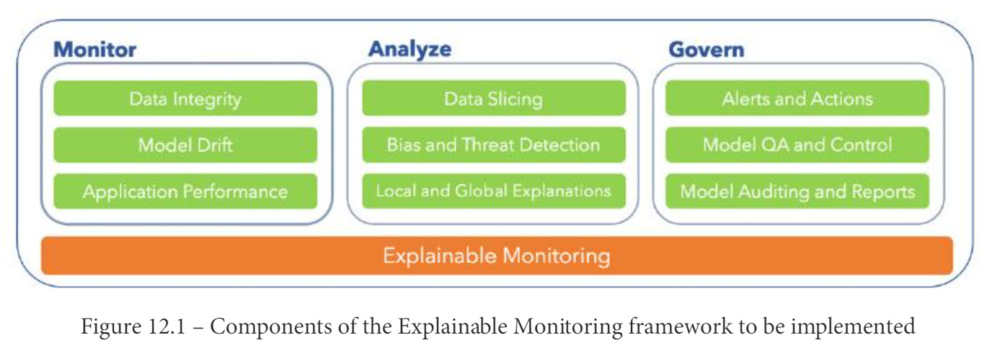

Nous mettrons en œuvre une surveillance explicable pour ces domaines : intégrité des données, gestion des modèles, performances des applications, détection des biais et des menaces, explications locales et globales, alertes et actions, AQ et contrôle des modèles, et audit et rapports des modèles. Ces composants sont les plus importants, dans notre cas d'utilisation, pour comprendre la mise en œuvre de la surveillance explicable. Nous laisserons de côté le découpage des données car nous n'avons pas beaucoup de variété en termes de données démographiques ou d'échantillons au sein des données (par exemple, le sexe, les groupes d'âge, etc.). 

En utilisant les informations provenant d'autres composants, nous pouvons évaluer les performances du modèle et son équité. Dans ce chapitre, nous allons implémenter les composants des modules Monitor and Analyze : Intégrité des données, Model Drive, Performances des applications, Détection des biais et des menaces, et Explications locales et globales. Les implémentations des composants restants seront couvertes dans le chapitre 13, Gouverner le système ML pour l'apprentissage continu. Avant de passer au processus de mise en œuvre, examinons comment les modèles peuvent être servis aux utilisateurs.

## Exploration des différents modes de service des modèles de ML 

Dans cette section, nous examinerons comment un modèle peut être servi pour les utilisateurs (humains et machines) afin de consommer efficacement le service de ML. Le service de modèle est un domaine critique, qu'un système de ML doit réussir pour atteindre son impact commercial, car tout décalage ou bogue dans ce domaine peut être coûteux en termes de service aux utilisateurs. 

La robustesse, la disponibilité et la commodité sont des facteurs clés à garder à l'esprit lorsque vous servez des modèles de ML. Jetons un coup d'œil à certaines manières dont les modèles ML peuvent être servis : cela peut être via un service par lots ou en mode à la demande (par exemple, lorsqu'une requête est effectuée à la demande afin d'obtenir une prédiction). Un modèle peut être servi à une machine ou à un utilisateur humain en mode à la demande. Voici un exemple de diffusion d'un modèle à un utilisateur


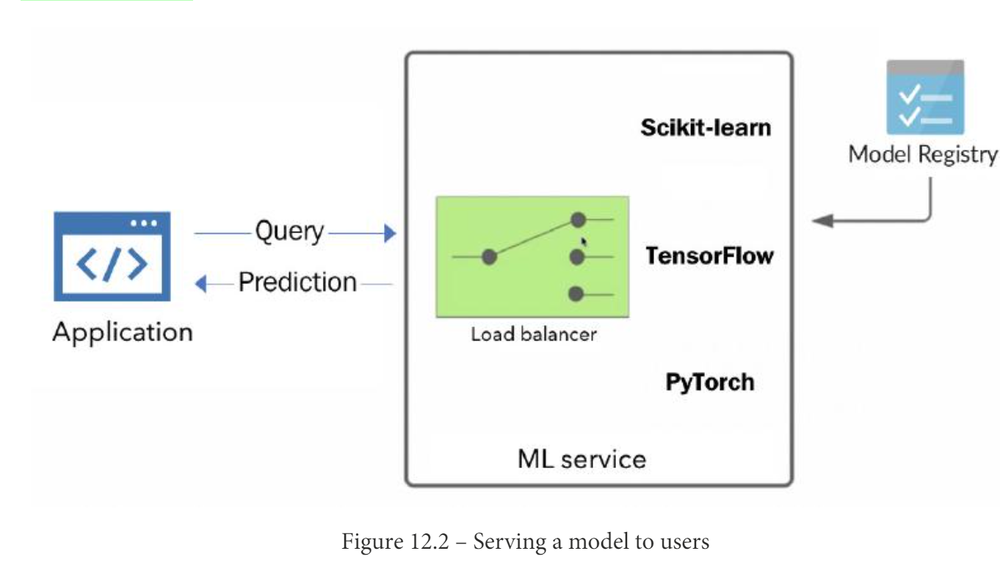

Dans un scénario typique (en mode à la demande), un modèle est servi comme un service à consommer par les utilisateurs, comme le montre la Figure 12.2. En effet, une application externe sur une machine ou un humain interroge le service de prédiction ou de ML à l'aide de leurs données. Le service ML, lors de la réception d'une demande, utilise un équilibreur de charge pour acheminer la demande vers une ressource disponible (telle qu'un conteneur ou une application) au sein de l'application ML. 

L'équilibreur de charge gère également les ressources au sein du service ML pour orchestrer et générer de nouveaux conteneurs ou ressources à la demande. L'équilibre de charge redirige la requête de l'utilisateur vers le modèle exécuté dans un conteneur au sein de l'application ML pour obtenir la prédiction. Lors de l'obtention de la prédiction, l'équilibre de charge revient à l'application externe sur une machine, ou à un humain qui fait la demande, ou à la requête dans la prédiction du modèle. De cette manière, le service ML est en mesure de servir ses utilisateurs. 

Le système ML s'articule avec le magasin de modèles ou le registre pour se tenir à jour avec les modèles les plus récents ou les plus performants afin de servir les utilisateurs de la meilleure manière. Par rapport à ce scénario typique où les utilisateurs effectuent une requête, il existe un autre cas d'utilisation où le modèle est servi en tant que service par lots.

## Servir le modèle en tant que service par lots 

Le traitement ou le traitement par lots est appliqué à de grandes quantités ou lots de données d'entrée (c'est-à-dire non pas des observations individuelles mais des groupes d'observations ensemble). Dans les cas où il y a un grand nombre de données à déduire, un modèle est normalement servi en mode batch. Un exemple en est lorsque le modèle est utilisé pour traiter les données de tous les consommateurs ou utilisateurs d'un produit ou d'un service en une seule fois. Alternativement, un lot de données d'une usine pour un calendrier xe peut avoir besoin d'être traité pour détecter des anomalies dans les machines. Par rapport au mode à la demande, le mode batch est plus économe en ressources et est généralement utilisé lorsqu'une certaine latence peut être autorisée :

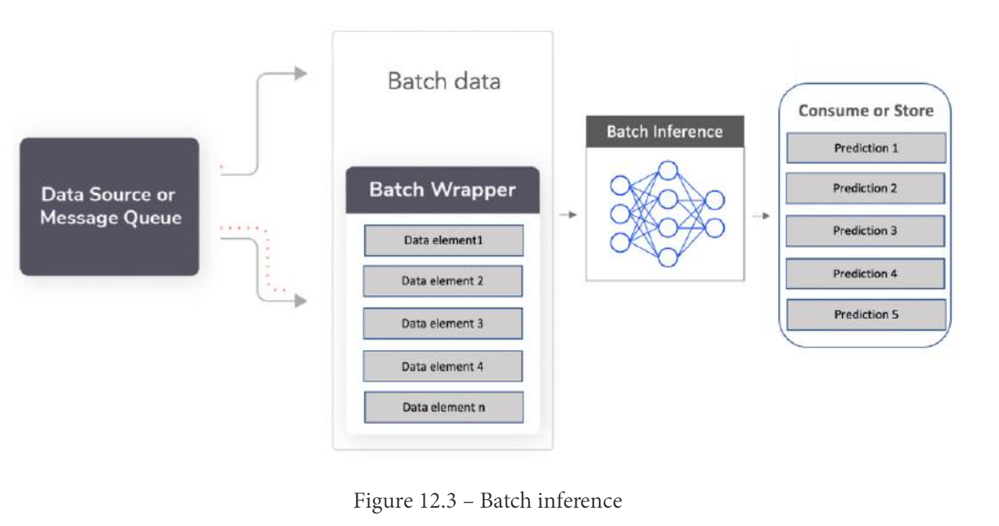

L'un des principaux avantages du traitement par lots est que, contrairement à un service basé sur une API REST, un service par lots peut nécessiter une infrastructure plus légère ou moins importante. L'écriture d'un travail par lots est plus facile pour un data scientist que le déploiement d'un service REST en ligne. Cela est dû au fait que le data scientist a juste besoin d'entraîner un modèle ou de désérialiser un modèle entraîné sur une machine et d'effectuer une inférence par lots sur un lot de données. Les résultats de l'inférence par lots peuvent être stockés dans une base de données au lieu d'envoyer des réponses aux utilisateurs ou aux consommateurs. Cependant, un inconvénient majeur est la latence élevée et le fait qu'il n'est pas en temps réel. En règle générale, un service par lots peut traiter des centaines ou des milliers de fonctionnalités à la fois. Une série de tests peut être utilisée pour déterminer la taille de lot optimale pour arriver à une latence acceptable pour le cas d'utilisation. Les tailles de lot typiques peuvent être de 32, 64, 128 ou 518 à la puissance 2. L'inférence de lot peut être planifiée périodiquement et peut servir de nombreux cas d'utilisation où la latence n'est pas un problème. Un tel exemple est discuté ci-après




    Un exemple du monde réel 
    
    Un exemple du monde réel est celui d'une banque qui extrait des
    informations à partir de lots de documents texte. Une banque reçoit des
    milliers de documents par jour de ses institutions partenaires. Il n'est
    pas possible pour un agent humain de les lire tous et de mettre en évidence
    les drapeaux rouges dans les opérations répertoriées dans les documents.
    L'inférence par lots est utilisée pour extraire les entités de nom et les
    drapeaux rouges de tous les documents reçus par la banque en une seule
    fois. Les résultats de l'inférence ou du service par lots sont ensuite
    stockés dans une base de données.

## Servir le modèle à un utilisateur humain 

Avant de traiter une demande d'utilisateurs humains, il est essentiel de vérifier si l'utilisateur dispose des autorisations adéquates pour utiliser le modèle. De plus, dans la plupart des cas, il est utile de connaître le contexte dans lequel la demande a été faite. Rassembler le contexte de la demande permettra au modèle de produire de meilleures prédictions. Après avoir rassemblé le contexte, nous pouvons le transformer en entrée lisible par le modèle et déduire le modèle pour obtenir une prédiction. En pratique, voici les étapes clés pour proposer un modèle à la demande aux utilisateurs humains : 

1. Validez ou autorisez la demande.
2. Analyser et recueillir des informations contextuelles (par exemple, des données historiques, des données d'expérience utilisateur ou toute autre donnée personnelle de l'utilisateur).
3. Transformez toute information contextuelle en une entrée ou un schéma lisible par modèle.
4. Déduire le modèle avec les données d'entrée (avec la demande et les informations contextuelles) pour faire une prédiction ou obtenir une sortie.
5. Interpréter la sortie selon le context.6. Relayer la sortie à l'utilisateur

## Servir le modèle à une machine 

Nous pouvons servir une machine ou une application externe en utilisant une API REST ou un service de streaming en fonction du cas d'utilisation. En règle générale, les exigences en matière de données d'inférence machine sont soit prédéterminées, soit dans un schéma standard. Une topologie et un schéma de données bien définis sous la forme d'une API REST ou d'un service de streaming fonctionneront. Servir à la demande à une machine ou à un humain varie d'un cas à l'autre, car, dans certains scénarios, la demande peut varier (par exemple, à un moment particulier de la journée où la demande pour servir l'utilisateur peut être élevée, comme dans l'avant midi). Pour gérer une demande élevée du service, l'autoscaling (sur le cloud) peut aider à générer plus de ressources à la demande et à tuer toutes les ressources inactives pour libérer plus de ressources. Cependant, la mise à l'échelle automatique n'est pas une solution unique pour la mise à l'échelle, car elle ne peut pas gérer à elle seule les pics de demande soudains ou particuliers :

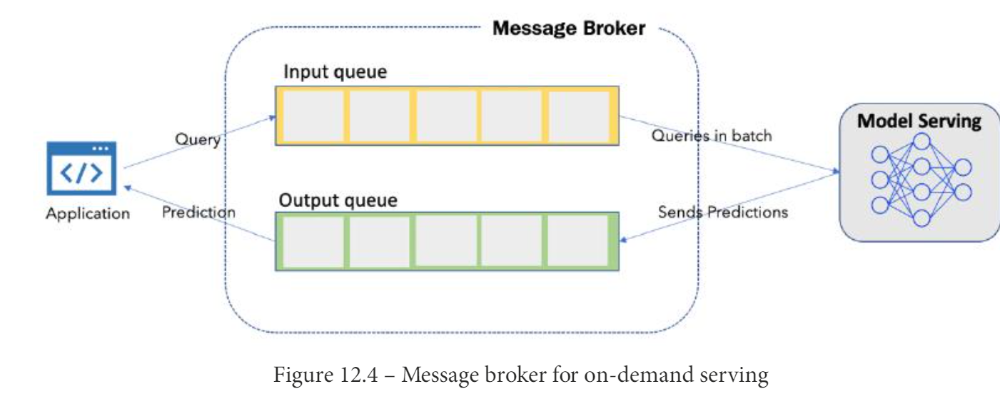

L'approche illustrée à la figure 12.4 est économe en ressources pour gérer les pics de demande de volume élevé. Pour gérer les pics soudains, les courtiers de messages tels que Apache Kafka ou Spark peuvent être utiles. Un courtier de messages exécute des processus pour écrire et lire dans une file d'attente : un processus pour écrire des messages dans une file d'attente et un autre processus pour lire à partir de cette file d'attente. Le modèle servi est périodiquement connecté au courtier de messages pour traiter des lots de données d'entrée de la file d'attente afin de faire des prédictions pour chaque élément du lot. Après le traitement des lots de données d'entrée et la génération de prédictions, les prédictions sont écrites dans la file d'attente de sortie, qui est ensuite transmise aux utilisateurs selon leurs demandes


    Un exemple concret
    
    Considérez une entreprise de médias sociaux qui compte des millions
    d'utilisateurs. L'entreprise utilise un modèle de ML unique ou commun pour
    le système de recommandation afin de recommander des articles de fil
    d'actualité ou des publications aux utilisateurs. Comme le volume de
    requêtes est élevé afin de servir de nombreux utilisateurs, il ne peut pas
    dépendre d'un système de ML basé sur l'API REST (car il est synchrone). Une
    solution de streaming est meilleure car elle fournit une inférence
    asynchrone à l'entreprise pour servir ses utilisateurs. Lorsqu'un
    utilisateur se connecte à son application ou à son compte hébergé sur une
    machine (comme un serveur d'entreprise de médias sociaux), l'application
    exécutée sur sa machine déduit le modèle ML (c'est-à-dire le système de
    recommandation) via un service de streaming pour les recommandations de
    l'utilisateur fil d'actualité. De même, des milliers d'autres utilisateurs
    se connectent en même temps. Le service de streaming peut servir tous ces
    utilisateurs de manière transparente. Notez que cela n'aurait pas été
    possible avec le service API REST. En utilisant un service de streaming
    pour le modèle de système de recommandation, la société de médias sociaux
    est en mesure de servir son grand nombre d'utilisateurs en temps réel, en
    évitant les décalages importants

## Mise en œuvre du cadre de surveillance explicable 

Pour mettre en œuvre le cadre de surveillance explicable, il vaut la peine de faire un récapitulatif de ce qui a été discuté jusqu'à présent, en termes de mise en œuvre de cas d'utilisation hypothétiques. Voici un récapitulatif de ce que nous avons fait pour la mise en œuvre de notre cas d'utilisation, y compris le problème et la solution :

* Contexte du problème : vous travaillez en tant que data scientist dans une petite équipe avec trois autres data scientists pour une compagnie de transport de fret basée dans le port de Turku en Finlande. 90 % des marchandises importées en Finlande arrivent par fret dans divers ports du pays. Pour le transport de marchandises, les conditions météorologiques et la logistique peuvent parfois être difficiles. Les conditions pluvieuses peuvent fausser les opérations et la logistique dans les ports, ce qui peut affecter les opérations de la chaîne d'approvisionnement. La prévision des conditions pluvieuses à l'avance nous permet d'optimiser les ressources telles que les ressources humaines, la logistique et les moyens de transport pour des opérations efficaces de la chaîne d'approvisionnement dans les ports. Du point de vue commercial, la prévision des conditions pluvieuses à l'avance permet aux ports de réduire leurs coûts d'exploitation jusqu'à environ 20 % en permettant une planification et une programmation efficaces des ressources humaines, de la logistique et des ressources de transport pour les opérations de la chaîne d'approvisionnement.


* • Tâche ou solution : en tant que data scientist, vous êtes chargé de développer une solution basée sur le ML pour prévoir les conditions météorologiques 4 heures à l'avance au port de Turku en Finlande. Cela permettra au port d'optimiser ses ressources, permettant ainsi des économies de coûts allant jusqu'à 20 %. Pour commencer, vous disposez d'un ensemble de données météorologiques historiques avec une chronologie de 10 ans à partir du port de Turku (l'ensemble de données est accessible dans le référentiel Git de ce repo). Votre tâche consiste à créer une solution de ML axée sur l'apprentissage continu pour optimiser les opérations au port de Turku


Jusqu'à présent, nous avons développé des modèles de ML et les avons déployés en tant que points de terminaison d'API REST dans un cluster Kubernetes à l'adresse http://20.82.202.164:80/api/v1/service/weather-prod-service/score (l'adresse de votre point de terminaison sera être différent). Ensuite, nous allons reproduire un scénario d'inférence réel pour ce point final. Pour ce faire, nous utiliserons l'ensemble de données de test que nous avons divisé et enregistré au chapitre 4, Pipelines d'apprentissage automatique, dans la section Ingestion de données et ingénierie des fonctionnalités. Accédez à votre espace de travail Azure ML et téléchargez l'ensemble de données test_data.csv (qui a été enregistré en tant que test_dataset) à partir de la section Ensembles de données ou du stockage Blob qui est connecté à votre espace de travail, comme illustré à la figure 12.5 :

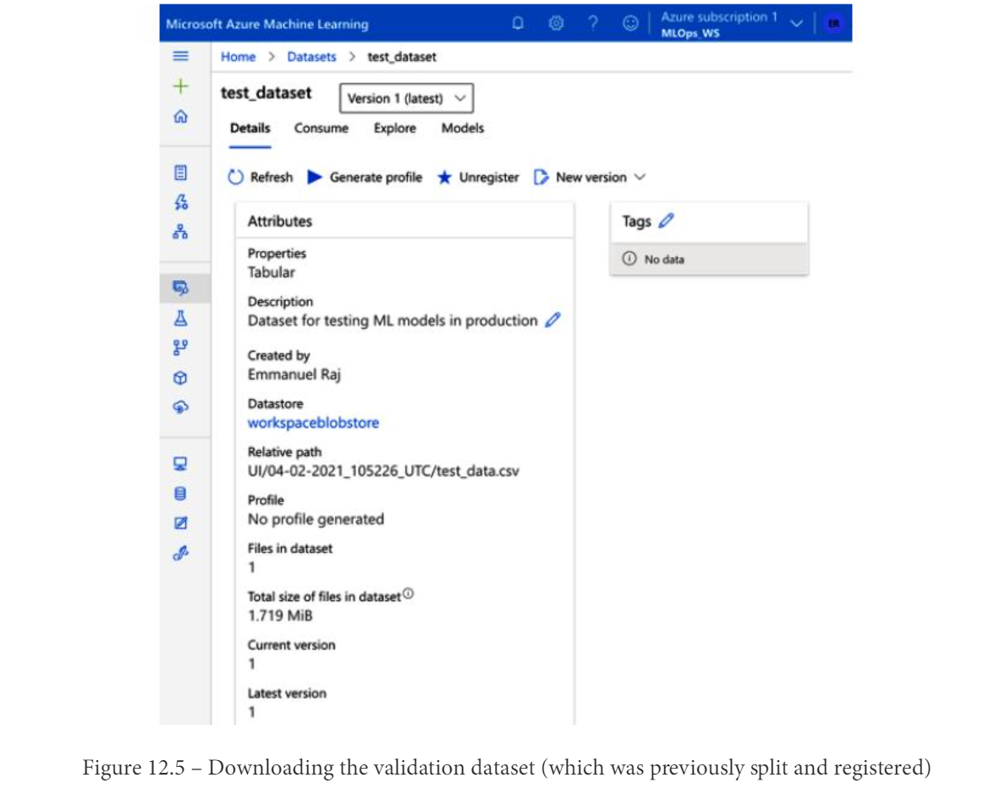

Préparez-vous à déduire les données test_data.csv avec le point de terminaison de l'API REST ou le service ML. Accédez au dossier 12_Model_Serving_Monitoring et placez l'ensemble de données téléchargé (test_data.csv) dans le dossier. Ensuite, accédez à l'inférence.py fichier :

1. Accédez à la section Datasets  et cliquez sur Create dataset. Ensuite, sélectionnez l'option À From datastore, comme illustré à la Figure 12.6 :

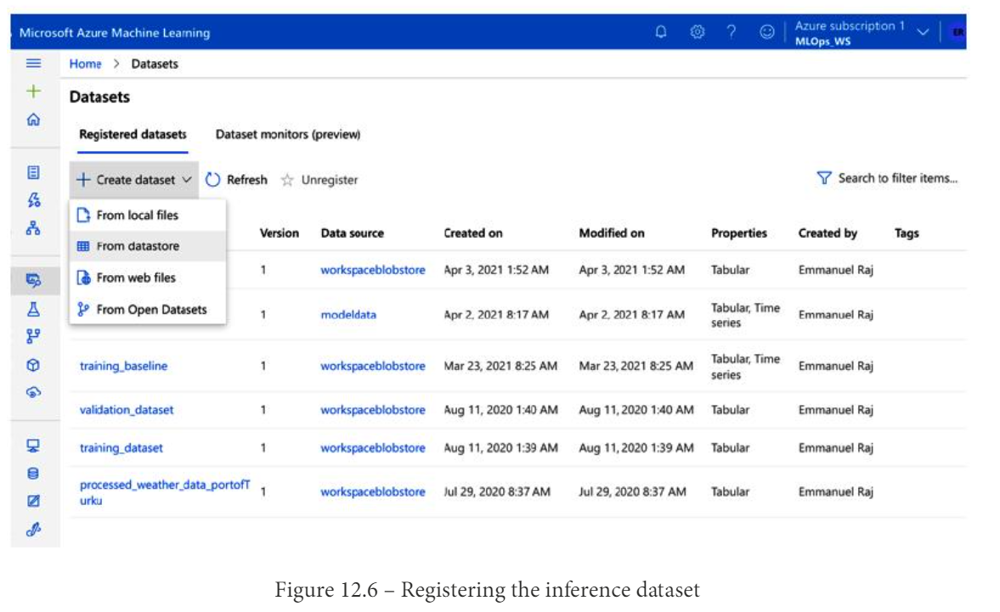

2. Nommez l'ensemble de données (par exemple, Inputs-Inference-Dataset), sélectionnez le type d'ensemble de données Tabular et écrivez une description appropriée dans le nom du champ Description en décrivant l'objectif de votre ensemble de données. Cliquez sur Suivant pour spécifier la sélection de la banque de données. Sélectionnez le magasin de données modeldata, comme illustré à la Figure 12.7 :

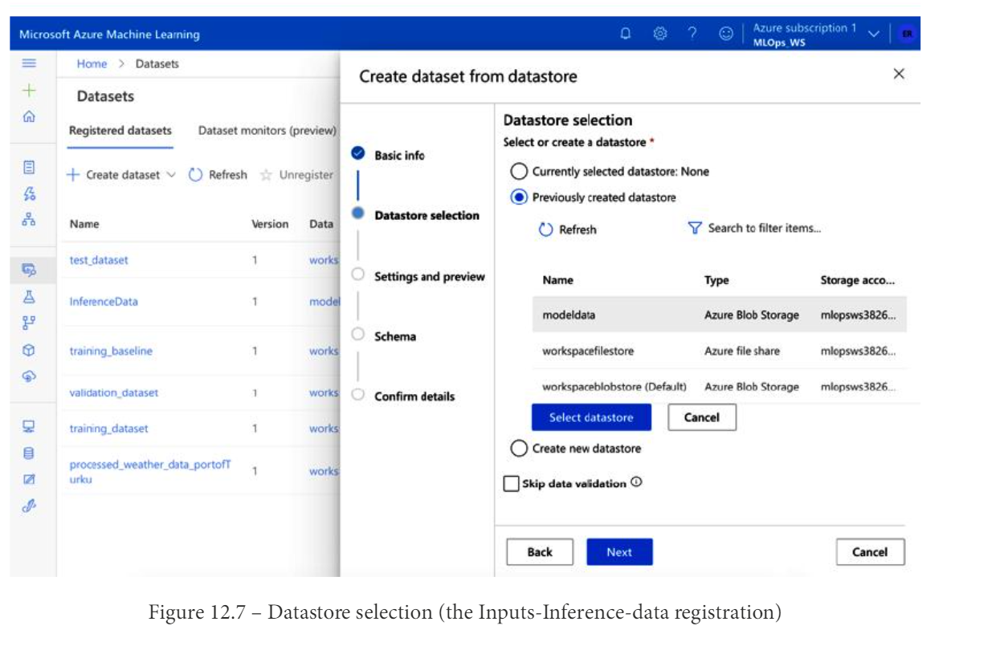

3. Après avoir sélectionné le magasin de données modeldata, vous serez invité à mentionner le chemin du ou des fichiers. Cliquez sur le bouton (Browse) Parcourir pour spécifier le chemin. Une liste de fichiers dans votre magasin de données modeldata vous sera présentée. Accédez à l'emplacement où vous pouvez repérer un fichier input.csv. Vous pouvez le trouver dans le dossier de votre modèle de vecteur de classement de support, qui se trouve dans le dossier avec le nom de votre service (par exemple, prod-webservice). Ensuite, allez dans les sous-dossiers (par défaut, entrées et dossiers structurés avec des dates), et allez dans le dossier de votre date actuelle pour trouver le fichier input.csv. Sélectionnez le fichier input.csv, comme illustré à la Figure 12.8 :

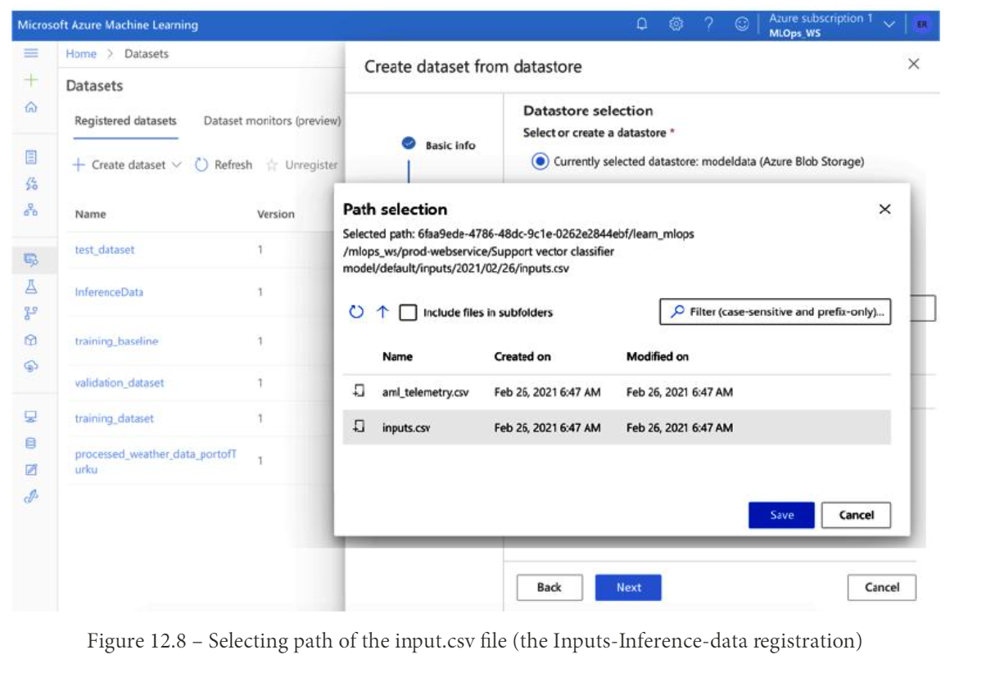

4. Après avoir sélectionné le fichier input.csv, cliquez sur le bouton Enregistrer et modifiez la dernière partie pour inclure /**/inputs*.csv (comme illustré à la Figure 12.9). Il s'agit d'une étape importante qui fera référence à tous les fichiers input.csv dans le dossier des entrées de manière dynamique. Sans référencer tous les fichiers input.csv, nous limiterons le chemin à un seul fichier input.csv (qui a été sélectionné précédemment dans la figure 12.8). En faisant référence à tous les fichiers input.csv, nous allons compiler toutes les données d'entrée (les fichiers input.csv) dans l'ensemble de données cible (par exemple, Inputs-Inference-Data) :

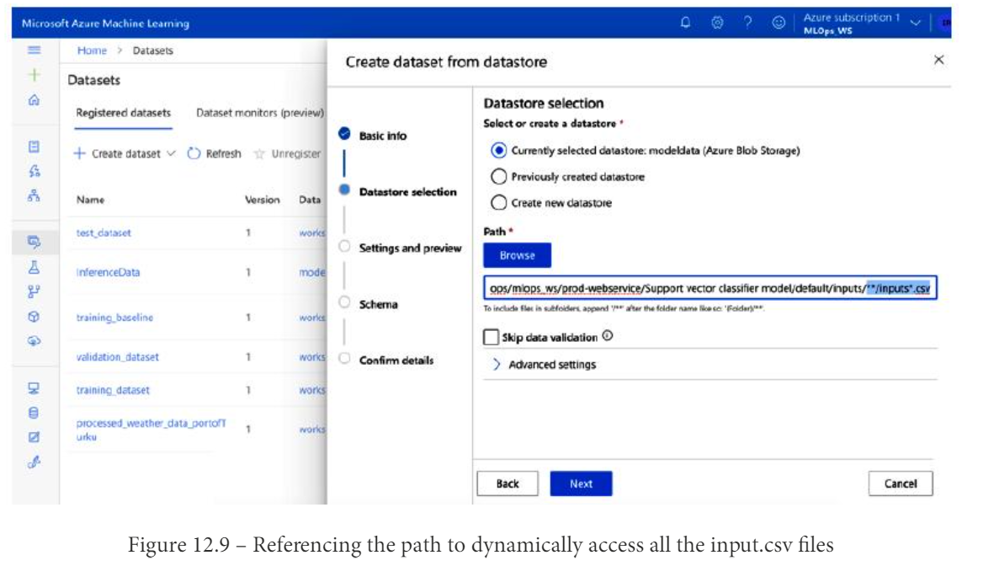



5. Cliquez sur le bouton Next pour passer aux Settings and preview :

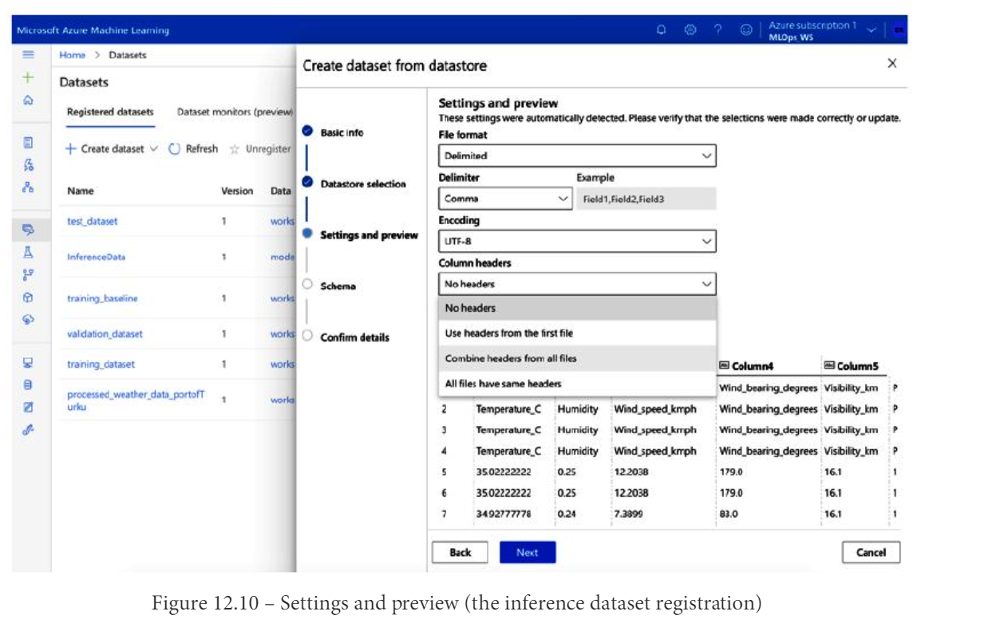

Comme le montre la Figure 12.10, nous pouvons congurer les paramètres et prévisualiser l'ensemble de données. Pointez sur les noms de colonnes corrects en sélectionnant la liste déroulante En-têtes de colonne(Column headers), puis en sélectionnant Combiner les en-têtes de tous les fichiers (Combine headers from all files) . Vérifiez les noms de colonne corrects (par exemple, Température_C et Humidity). Après avoir sélectionné les noms de colonnes appropriés, cliquez sur le bouton Suivant pour passer à la fenêtre suivante. Sélectionnez le bon schéma en sélectionnant toutes les colonnes que vous souhaitez surveiller, ainsi que leurs types de données, comme illustré à la Figure 12.11 :

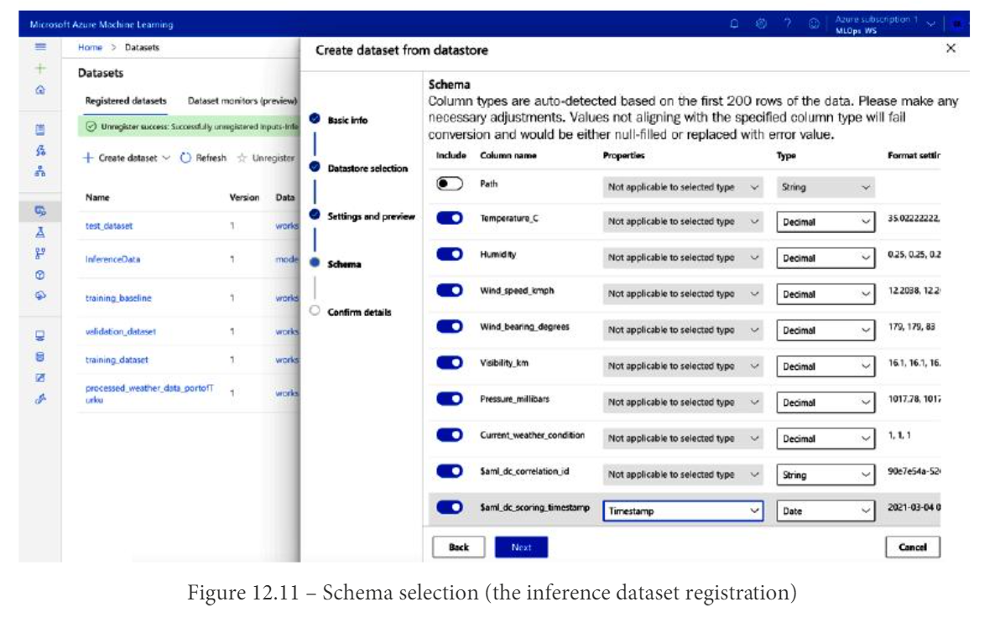

Assurez-vous de sélectionner les propriétés Timestamp et Date dans la colonne $aml_dc_scoring_timestamp car elles contiennent les horodatages de l'inférence. Cette étape est importante. Seul un jeu de données au format chronologique peut être utilisé pour calculer drive (par le modèle Azure drive) ; sinon, on ne peut pas calculer drive. Après avoir sélectionné le bon schéma en sélectionnant toutes les colonnes, cliquez sur Suivant pour confirmer tous les détails nécessaires (tels que le nom du jeu de données, la version du jeu de données, son chemin, etc.).


6. Cliquez sur le bouton Créer (Create)pour créer le jeu de données. Lorsque votre jeu de données a été créé avec succès, vous pouvez afficher le jeu de données à partir de la section Dataset  dans votre espace de travail Azure ML. Accédez à la section Datasets pour confirmer que votre ensemble de données a été créé. Identifiez et cliquez sur votre jeu de données créé. En cliquant, vous pourrez afficher les détails de votre jeu de données d'inférence enregistré, comme illustré à la Figure 12.12 :

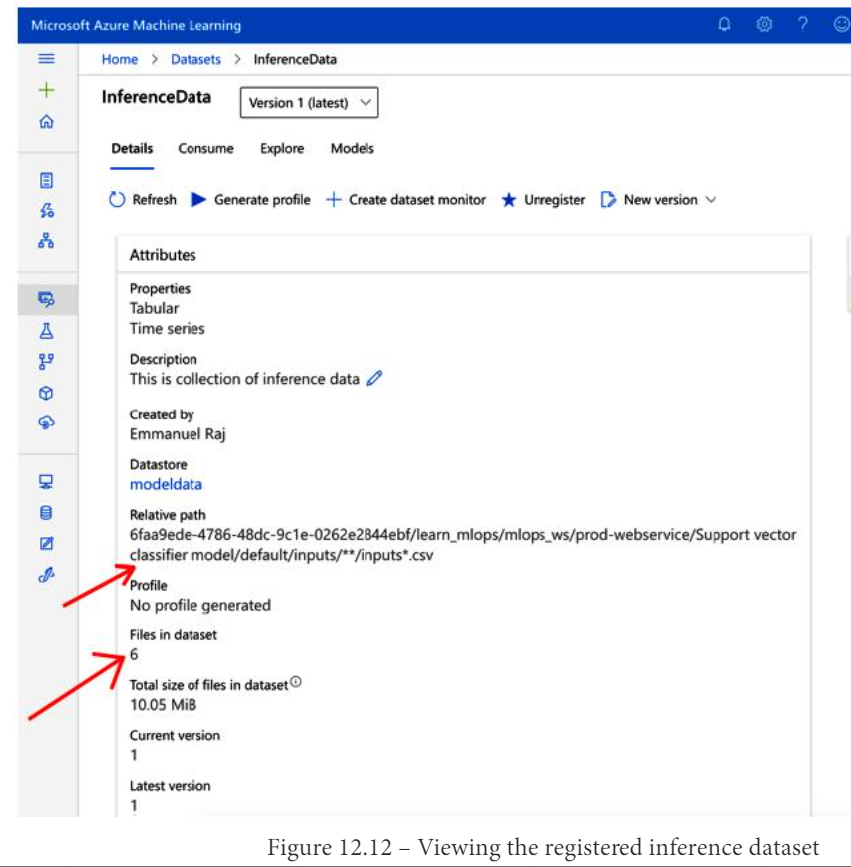

Vous pouvez voir tous les attributs essentiels de votre ensemble de données enregistré dans la Figure 12.12. Il est important de noter que le chemin relatif est dynamique et qu'il pointe vers le référencement de tous les fichiers input.csv. Le résultat du référencement de tous les fichiers d'entrée est affiché dans Fichiers du jeu de données. Cela affichera plusieurs fichiers à long terme (c'est-à-dire qu'il affichera 6 fichiers après 6 jours d'enregistrement de l'ensemble de données). Cela peut être 1 fichier pour vous, car vous venez juste d'enregistrer l'ensemble de données. Au fil des jours ou du temps, le nombre de fichiers input.csv continuera d'augmenter à mesure qu'un nouveau fichier input.csv est créé dans la banque de données dans le stockage Blob chaque jour. Félicitations pour l'enregistrement des données d'inférence. Ensuite, nous allons congurer le moniteur de dri données.

## Création du moniteur de dérive des données 

Pour surveiller la dérive des données et la dérive des fonctionnalités, nous utiliserons les fonctionnalités de surveillance de la dérive intégrées de l'espace de travail Azure ML dans le cadre de la section Ensembles de données. Pour surveiller les drives, configurons une fonctionnalité Data Drift Monitor sur notre espace de travail Azure ML:

1. Accédez à votre espace de travail et accédez à la section Datasets . Ensuite, sélectionnez Dataset Monitors (il est en mode aperçu pour le moment, car cette fonctionnalité est toujours en cours de test). Cliquez sur Créer, comme illustré à la Figure 12.13 :

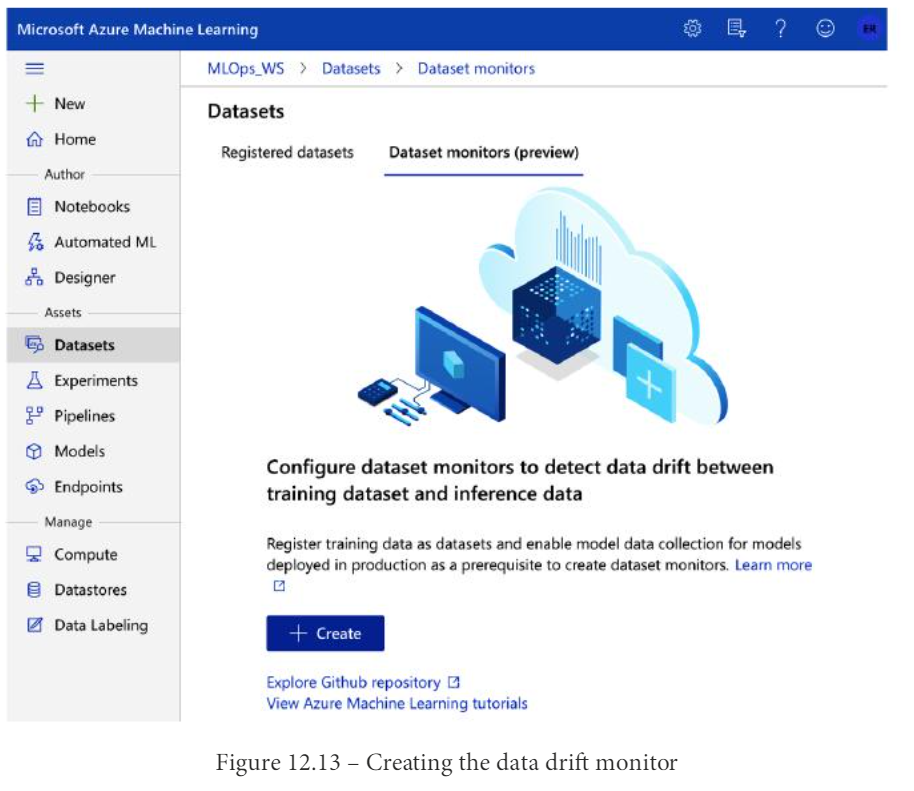

2. Après avoir sélectionné le bouton Create , vous serez invité à créer un nouveau moniteur de transfert de données. Sélectionnez l'ensemble de données cible de votre choix.

3. Dans la section Enregistrement de l'ensemble de données cible, nous avons enregistré les fichiers input.csv en tant que Input-InferenceData. Sélectionnez votre jeu de données d'inférence comme jeu de données cible, comme illustré à la Figure 12.14 :

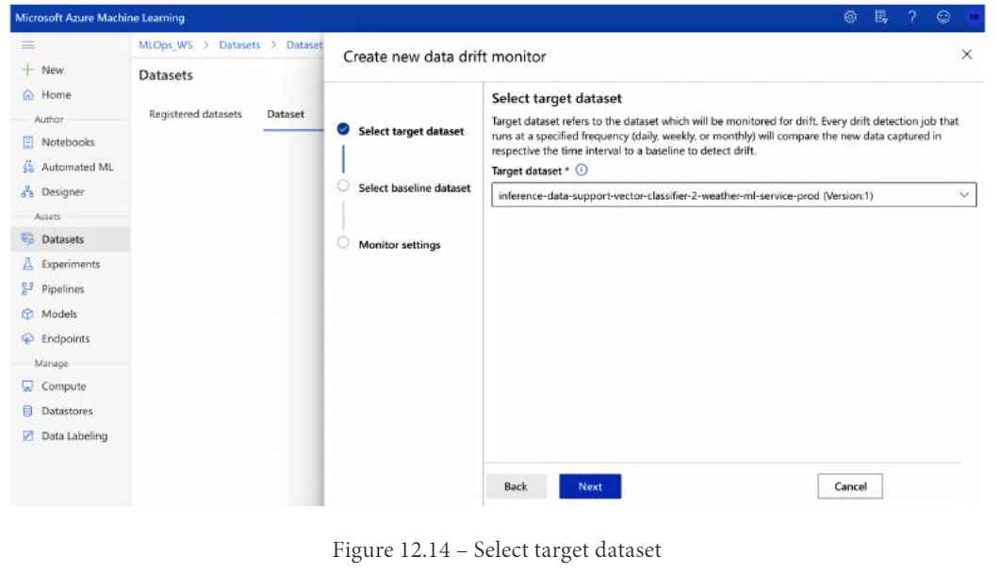

4. Après avoir sélectionné votre ensemble de données cible, vous serez invité à pointer vers votre ensemble de données de base, qui devrait être votre ensemble de données d'entraînement (il a été utilisé pour entraîner votre modèle de ML déployé). Sélectionnez votre jeu de données de référence, comme illustré à la Figure 12.15 :

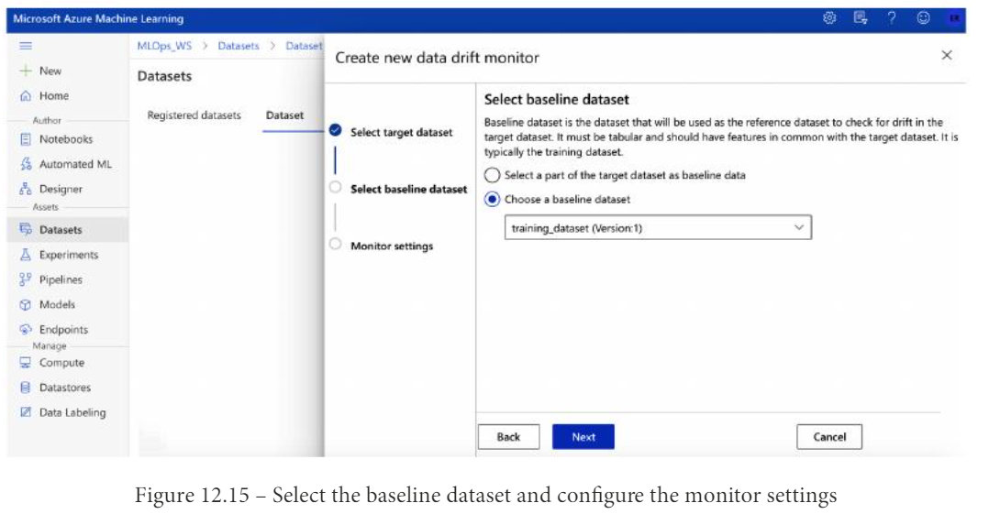

5. Après avoir sélectionné l'ensemble de données de base, vous serez invité à configurer les paramètres du moniteur, tels que le nom du moniteur de collecte de données (par exemple, météo-Data-Drift), la cible de calcul pour exécuter les tâches de collecte de données, la fréquence des tâches de drive de données (par exemple, une fois par jour), et le seuil de surveillance de drive (par exemple, 60). Il vous sera également demandé de donner un e-mail de votre choix pour recevoir des notifications lorsque la perte de données dépasse un seuil défini.

6. Après avoir configuré les paramètres, créez un moniteur d'évacuation des données. Accédez à votre dri de données nouvellement créé (dans la section Datasets, cliquez sur Dataset Monitors pour afficher vos drive monitors), comme le montre la Figure 12.16 :


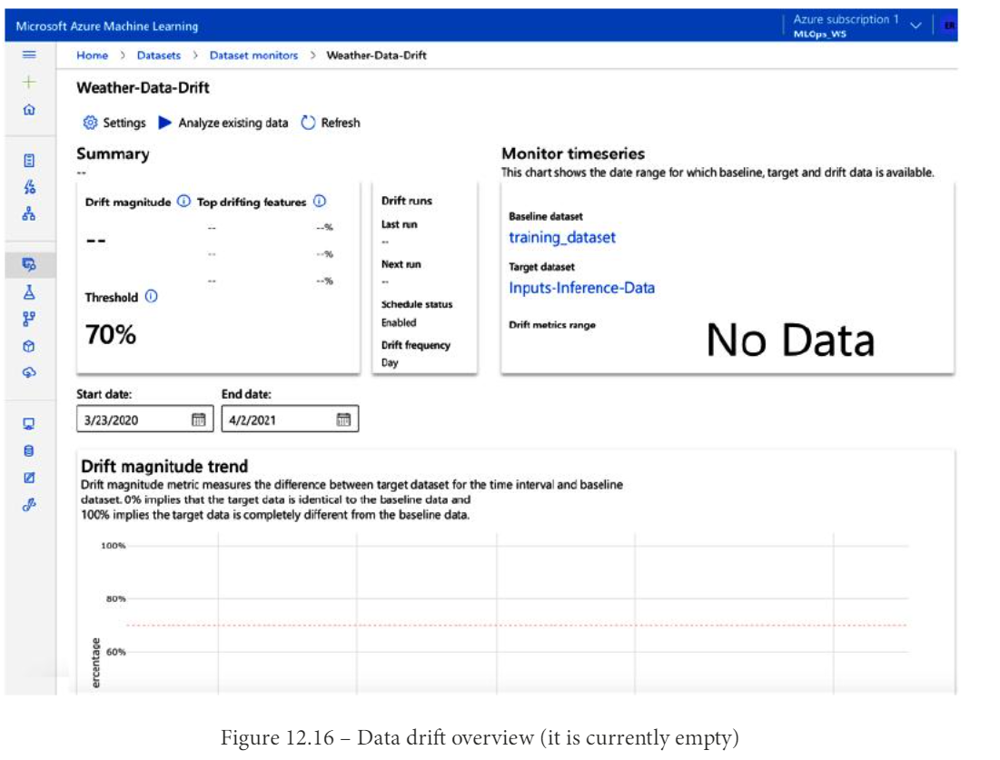

Lorsque vous accédez à votre moniteur de drive de données, vous verrez qu'il n'y a pas de données. C'est parce que nous n'avons pas encore calculé de drive. Afin de calculer drive, nous avons besoin d'une ressource de calcul.

7. Accédez à la section Compute, accédez à l'onglet Compute clusters et créez une nouvelle ressource de calcul (par exemple, drive-compute – Standard_DS_V2 machine), comme illustré à la Figure 12.17 :

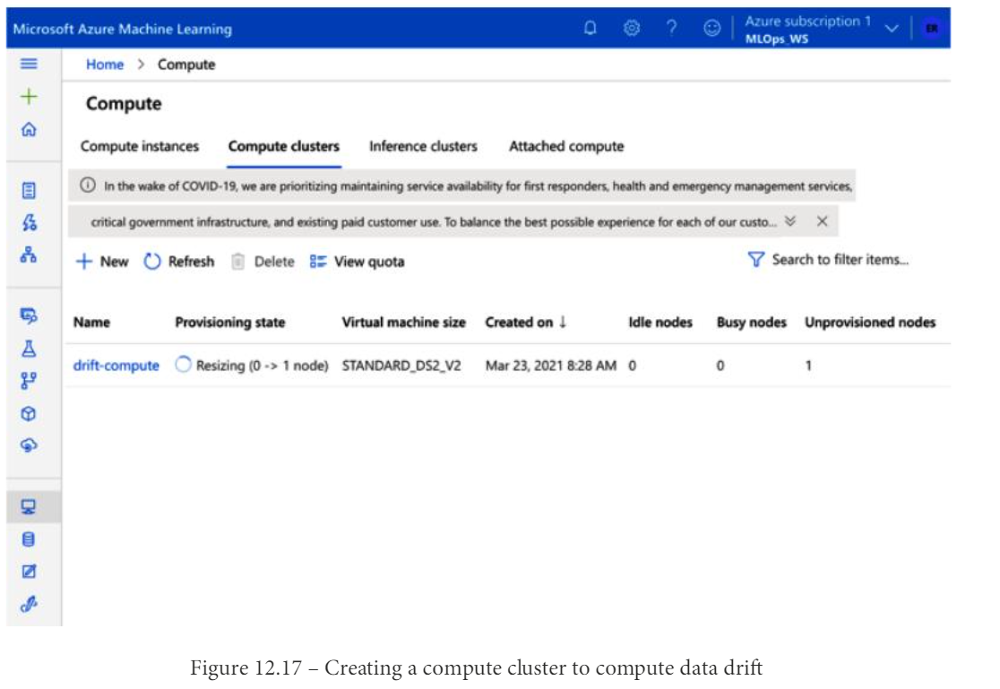

8. Après avoir créé le cluster de calcul, revenez à votre moniteur de drive de données (par exemple, Weather-Data-Drive). Ensuite, nous allons calculer les données drive

9. Cliquez sur Analyser les données existantes et soumettez une exécution pour analyser toutes les données d'inférence existantes, comme illustré à la Figure 12.18 :

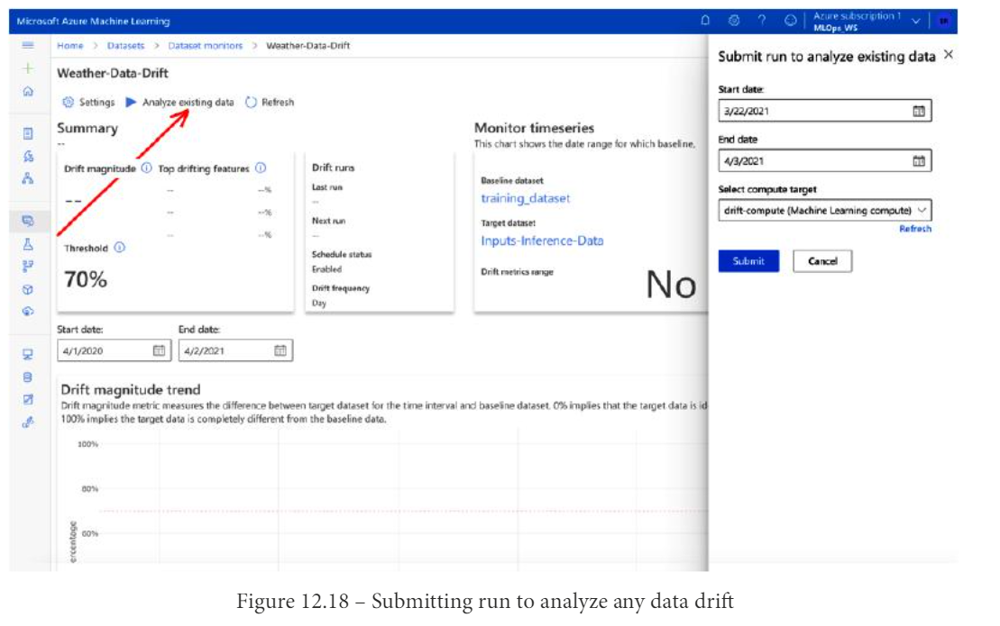

10. Sélectionnez les dates de début et de fin et la cible de calcul (qui a été créée précédemment, c'est-à-dire drive-compute). Ensuite, cliquez sur Soumettre (Submit) pour lancer le calcul drive. Il faut généralement environ 10 minutes pour analyser et calculer la collecte de données. Vous pouvez suivre la progression de vos exécutions dans la section Expériences (Experiments) de votre espace de travail Azure ML.

 Analyse de la collecte des données (Data drive analysi) : après avoir terminé avec succès l'analyse, la collecte des données a été calculée. À l'aide de la vue d'ensemble drive, comme illustré à la figure 12.19, nous pouvons surveiller et analyser les performances de votre modèle ML en production. Nous pouvons visualiser la magnitude et la distribution des données par caractéristiques :

 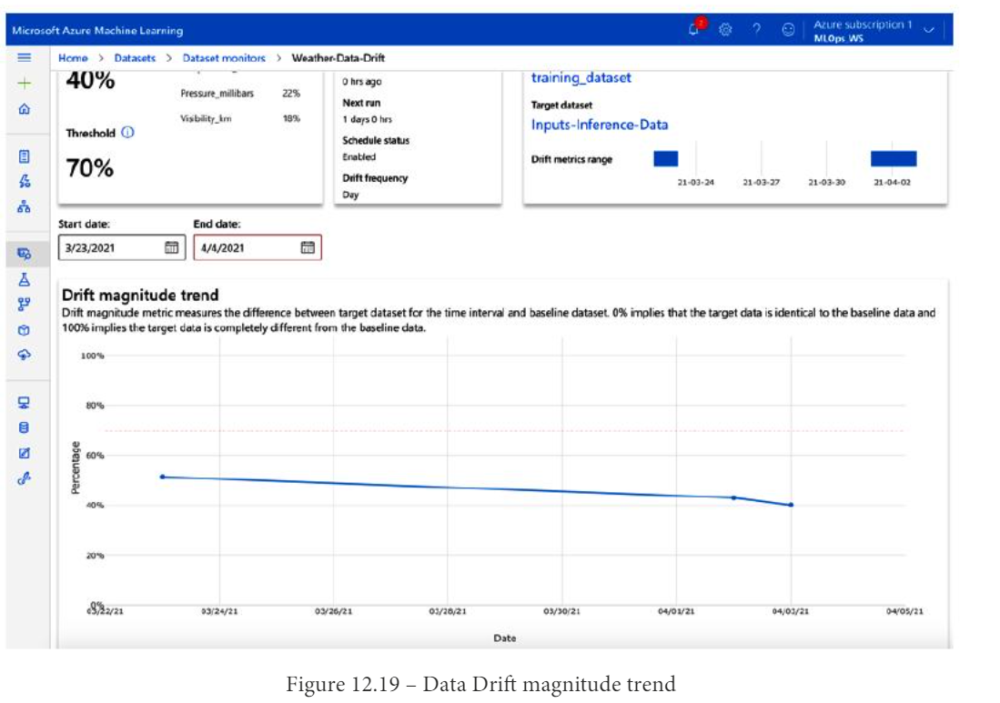

La façon dont le modèle drive est mesuré par le service Azure ML est qu'il utilise un modèle de drive distinct (maintenu par Azure), qui examine la ligne de base et compare les données d'inférence. Cette comparaison donne un simple pourcentage statistique ou un degré de changement dans les données. 

Dans la figure 12.19, la tendance de la magnitude Drive suggère que nous avons eu des inférences faites au modèle sur 3 jours (c'est-à-dire, 23/03/21, 04/ 21/03 et 21/04/21). L'analyse montre que le flux de données à ces trois occasions est inférieur au seuil de 70 % (c'est la ligne rouge qui indique le seuil). Le flux de données du 23/03/21 est d'environ 50 % ; au 21/03/04, il est d'environ 44% ; et au 21/04/21, il est de 40 %. Cela nous donne une idée de la tendance changeante des données d'inférence entrantes dans le modèle. De même, nous pouvons surveiller la fonctionnalité drive


* Analyse de la dérive des fonctionnalités : vous pouvez évaluer les fonctionnalités individuelles et leur dérive en faisant défiler jusqu'à la section Détails de la fonctionnalité et en sélectionnant une fonctionnalité de votre choix. Par exemple, nous pouvons voir la distribution de Temperature_C dans le temps, comme illustré à la Figure 12.20 :

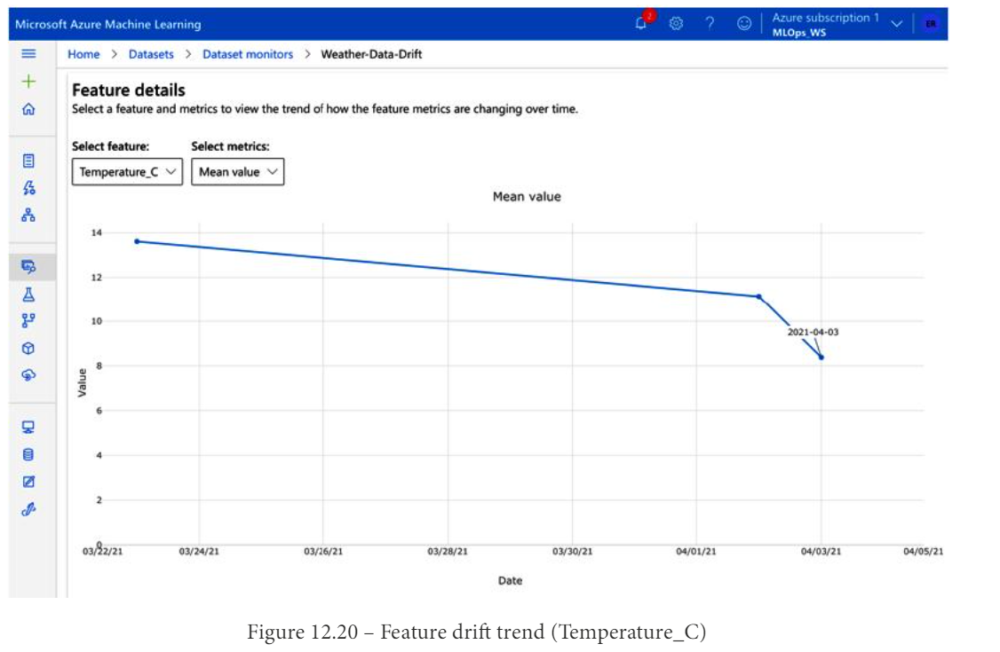

Pour surveiller l'évolution de la fonctionnalité au fil du temps, nous pouvons sélectionner certaines métriques de notre choix pour la fonctionnalité. Des métriques telles que la valeur moyenne, la valeur minimale, la valeur maximale, la distance euclidienne ou la distance de Wasserstein sont disponibles pour analyser la dérive des caractéristiques. Sélectionnez une métrique de votre choix (par exemple, valeur moyenne). Nous avons sélectionné la métrique de la valeur moyenne pour évaluer la variation de température, comme le montre la figure 12.20. La métrique de la valeur moyenne est passée de 14 à 8 au fil du temps ; cela montre le changement de drive dans la fonction Temperature_C. Un tel changement est attendu car les changements saisonniers donnent lieu à des changements de température. Nous pouvons également surveiller le changement de distribution des fonctionnalités, comme le montre la figure 12.21 :

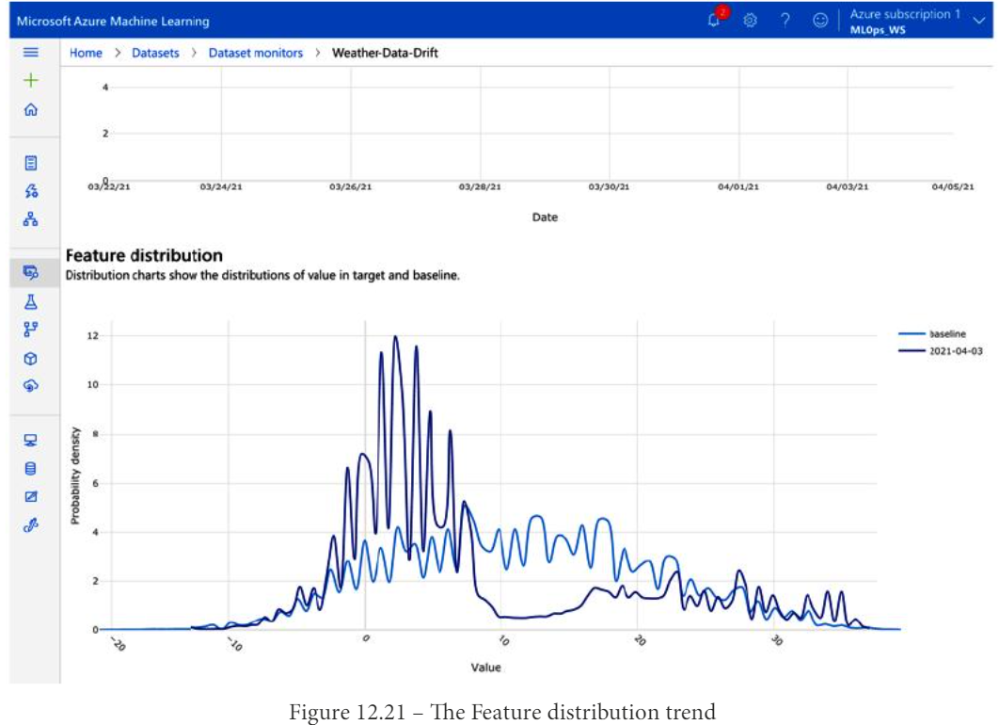

Si le drive est drastique ou anormal, nous devons vérifier la qualité des données d'entrée déduites dans le système. Les informations sur les fonctionnalités nous permettent de comprendre les données changeantes et le monde qui nous entoure. De même, nous pouvons surveiller l'évolution du modèle pour comprendre les performances du modèle en fonction de l'évolution des données et du monde.

## Model drift

Monitoring model drive nous permet de contrôler les performances de nos modèles en production. Le modèle drive est l'endroit où les propriétés des variables dépendantes changent. Par exemple, dans notre cas, il s'agit des résultats de la classification du temps (c'est-à-dire pluie ou pas de pluie). Tout comme nous avons configuré la gestion des données dans la section Création du moniteur de gestion des données, nous pouvons également configurer un moniteur de gestion des modèles pour surveiller les sorties du modèle. Voici les étapes de haut niveau pour configurer le modèle drive:

1. Enregistrez un nouvel ensemble de données (par exemple, Output-Inference-Data) en référençant tous les fichiers Outputs.csv. 
L'ensemble de données de sorties peut être créé à partir de la section Ensembles de données (Datasets) . Lors de la création d'un ensemble de données d'inférence de sorties, sélectionnez les colonnes importantes (par exemple, Future_Weather_Condition) et modifiez l'ensemble de données au format tabulaire et chronologique (drive ne peut être calculé qu'en données chronologiques) en sélectionnant une colonne avec Timestamp. 

2. Créez un nouveau moniteur (par exemple, drift monitor) à partir de la section Dataset, et cliquez sur Dataset Monitor. Sélectionnez la fonctionnalité à surveiller (par exemple, les future weather condition) et définissez un seuil que vous souhaitez surveiller. 

3. Analysez le modèle drive dans la vue d'ensemble (comme illustré à la Figure 12.22) :

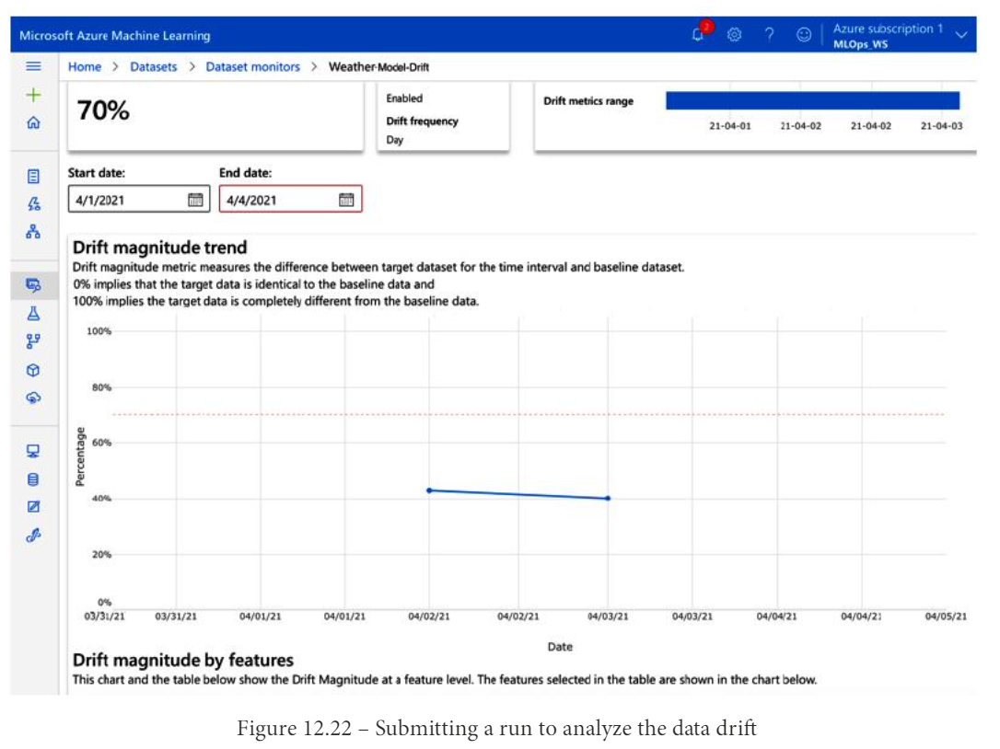

Si votre modèle drive a dépassé un seuil défini, cela peut indiquer que vous devez recycler ou entraîner vos résultats de comparaison de modèle en un simple pourcentage statistique ou un degré de changement dans les données. Lorsque la perte de données a dépassé le seuil (par exemple, 70%), nous pouvons informer l'administrateur ou le propriétaire du produit par e-mail ou prendre des mesures telles que le déploiement d'un autre modèle ou le recyclage du modèle existant. En utilisant des actions intelligentes, nous pouvons gouverner les systèmes de ML pour produire une valeur maximale. Nous explorerons les moyens de gouverner les systèmes de ML dans le prochain chapitre (Chapitre 13, Gouverner le système de ML pour l'apprentissage continu). Jusqu'à présent, nous avons implémenté la configuration drift données, fonctionnalité drift et drift modèle. Ensuite, surveillons les performances des applications du système ML.

## Performances de l'application 

Vous avez déployé le service ML sous la forme de points de terminaison d'API REST, qui peuvent être consommés par les utilisateurs. Nous pouvons surveiller ces points de terminaison à l'aide d'Azure Application Insights (activé par Azure Monitor). Pour surveiller les performances de nos applications, accédez au tableau de bord Application Insights, comme illustré à la Figure 12.23. Accédez à la section Points ( de terminaison (Endpoints ) dans votre espace de travail de service Azure ML et sélectionnez le point de terminaison de l'API REST sur lequel votre modèle de ML est déployé. Cliquez sur l'URL d'Application Insights (Application Insights url) pour accéder au point de terminaison d'Application Insights connecté à votre point de terminaison d'API REST :

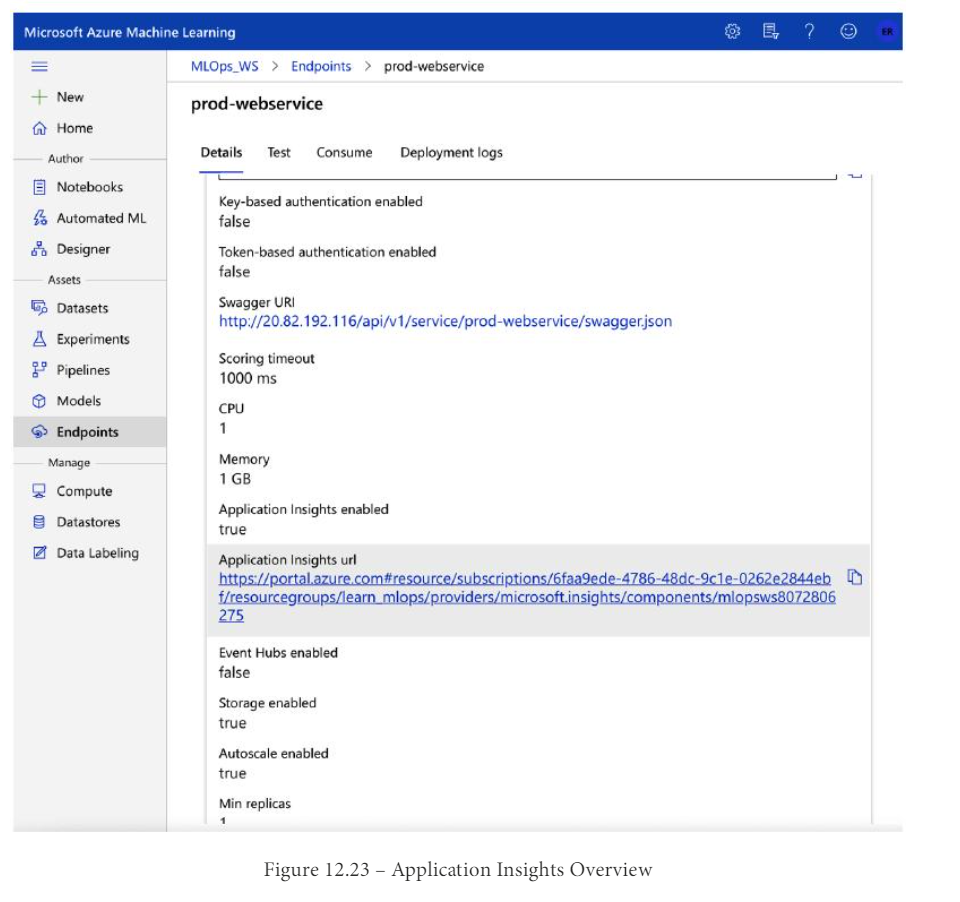

À partir de la section Présentation d'Application Insights, nous pouvons surveiller et analyser les informations critiques sur les performances des applications pour votre service ML. De plus, nous pouvons surveiller des informations telles que les demandes ayant échoué, le temps de réponse du serveur, les demandes du serveur et la disponibilité à partir de la section Présentation(Overview ), comme illustré à la Figure 12.24 :

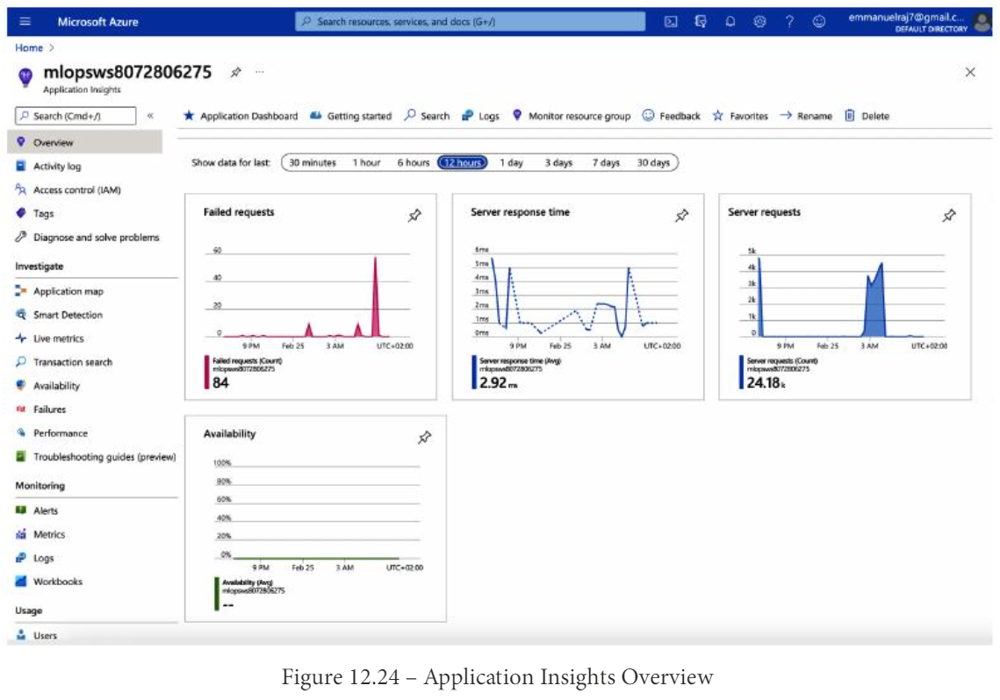

Sur la base de ces métriques et de ces informations, nous pouvons surveiller les performances de l'application. Idéalement, nous ne devrions pas avoir de requêtes échouées ou de longs temps de réponse du serveur. Pour obtenir des informations plus détaillées sur les performances de l'application, nous pouvons accéder au tableau de bord de l'application (en cliquant sur le bouton en haut de l'écran), comme illustré à la Figure 12.25 :

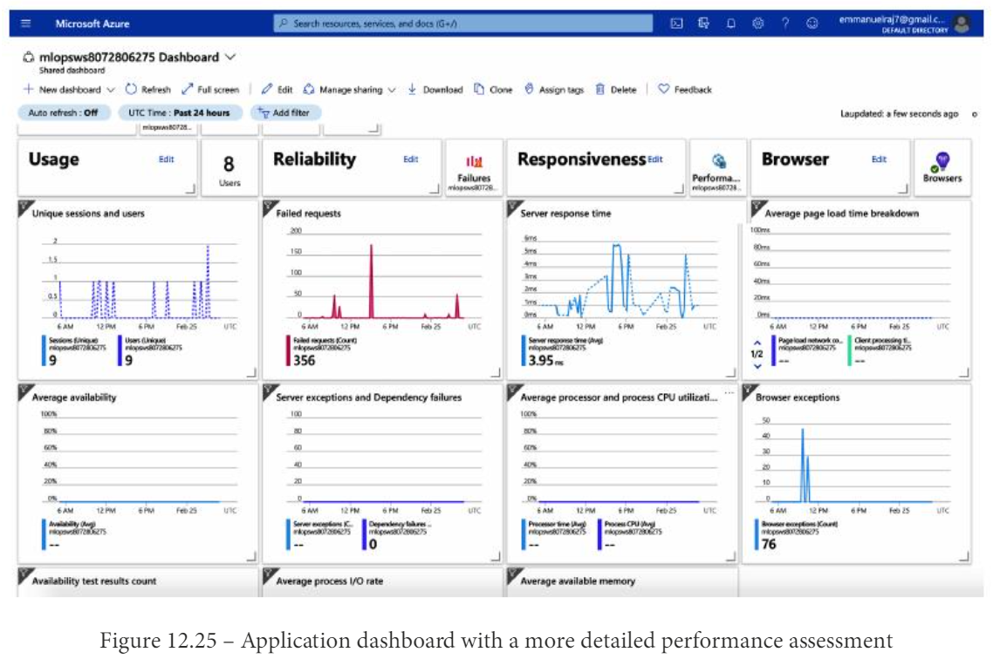

Sur la base de ces métriques et de ces informations, nous pouvons surveiller les performances de l'application. Idéalement, nous ne devrions pas avoir de requêtes échouées ou de longs temps de réponse du serveur. Pour obtenir des informations plus détaillées sur les performances de l'application, nous pouvons accéder au tableau de bord de l'application (en cliquant sur le bouton en haut de l'écran), comme illustré à la Figure 12.25 : Figure 12.25 - Tableau de bord de l'application avec une évaluation plus détaillée des performances 

À partir du tableau de bord de l'application , nous pouvons surveiller les performances de l'application plus en détail. Par exemple, nous pouvons surveiller l'utilisation des applications, leur fiabilité et d'autres informations. En termes d'utilisation, les sessions uniques et les utilisateurs sont des informations essentielles pour surveiller le nombre d'utilisateurs uniques que l'application est capable de servir. De plus, les informations sur la disponibilité moyenne sont utiles pour évaluer la disponibilité du service pour nos utilisateurs. Avec ces informations, nous pouvons prendre des décisions de mise à l'échelle si davantage de ressources sont nécessaires pour servir les utilisateurs. Nous pouvons surveiller la fiabilité des applications en évaluant des informations telles que le nombre de requêtes ayant échoué, les exceptions de serveur et les échecs de dépendance. Nous pouvons surveiller la réactivité à l'aide d'informations telles que le temps de réponse moyen du serveur et l'utilisation du processeur. Idéalement, l'application ne devrait avoir aucun échec, et s'il y a des échecs, nous pouvons examiner de plus près les journaux de l'application, comme le montre la Figure 12.26, en accédant à la recherche de transaction ou aux journaux :

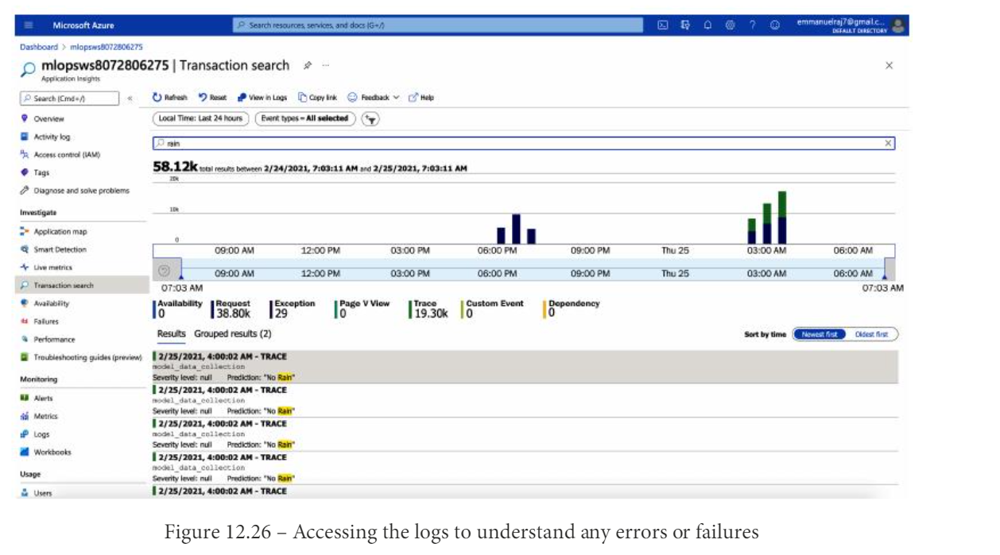

Nous pouvons examiner de plus près les journaux des applications pour comprendre les éventuels échecs ou erreurs afin de déboguer l'application et maintenir le bon fonctionnement de l'application. Une application ML fonctionnelle se traduit par des utilisateurs satisfaits et un impact commercial maximal. Par conséquent, la surveillance des applications peut être gratifiante pour révéler les défaillances potentielles et maintenir l'application afin de servir les utilisateurs de la manière la plus ecace.

## Analyser votre système de ML

Le suivi et l'analyse de votre système de ML en production en temps réel sont essentiels pour comprendre les performances de votre système de ML et garantir sa robustesse pour générer une valeur commerciale maximale. Les humains jouent un rôle clé dans l'analyse des performances des modèles et la détection d'anomalies et de menaces subtiles. Nous pouvons analyser les performances du modèle pour détecter tout biais ou menace et comprendre pourquoi le modèle prend des décisions selon un certain schéma. Nous pouvons le faire en appliquant des techniques avancées, telles que le découpage des données, les techniques de prévention des attaques contradictoires, ou en comprenant les explications locales et globales.

## Découpage des données 

Pour notre cas d'utilisation, nous laisserons de côté le découpage des données car nous n'avons pas beaucoup de variété en termes de démographie ou d'échantillons dans les données (par exemple, le sexe, les groupes d'âge, etc.). Pour mesurer l'équité du modèle, nous nous concentrerons sur la détection des biais.

## Détection du biais et des menaces 

Pour déterminer le biais du modèle dans la production, nous pouvons utiliser une méthode de compromis biais-variance. Cela facilite le suivi et l'analyse du biais du modèle ou de toute menace possible. Il va sans dire qu'il existe peut-être de meilleures méthodes pour surveiller les biais, mais l'idée ici est de rester simple, car, parfois, la simplicité est meilleure et plus eficace. La disparité entre la prédiction moyenne de notre modèle et la bonne valeur que nous essayons de prédire est le biais. La variance est la variabilité de l'estimation du modèle pour un point de données donné ou une valeur qui nous informe de notre diffusion de données. L'analyse du biais et de la variance pour les données d'inférence pour le modèle déployé révèle que le biais est de 20,1 et la variance de 1,23 (vous pouvez en savoir plus sur l'analyse du biais et de la variance sur https://machinelearningmastery.com/calculate-the-bias-variance-trade -désactivé/). Cela signifie que notre modèle a un biais élevé et une faible variance ; par conséquent, il peut être judicieux d'entraîner ou de recycler notre modèle avec des données d'inférence pour équilibrer le biais-variance.

## Explications locales et globales

Les explications locales et globales offrent des perspectives diérentes sur les performances du modèle. L'explication locale offre une justification pour la prédiction du modèle pour une entrée spécifique ou individuelle, tandis que l'explication globale fournit des informations sur le processus prédictif du modèle, indépendamment de toute entrée particulière. Nous avons précédemment examiné les explications globales tout en explorant les risques de surveillance dans la figure 12.19. Nous pouvons étudier plus en détail la distribution des caractéristiques, comme le montre la figure 12.21, pour comprendre en détail les explications locales. L'analyse de votre système de ML en termes d'équité, de partialité et d'explications locales et globales nous donne des informations clés sur les performances du modèle, et nous pouvons utiliser ces informations pour régir notre système de ML.

## Gouverner votre système de ML 

Une grande partie de la gouvernance du système implique l'assurance et le contrôle de la qualité, l'audit des modèles et la création de rapports pour assurer une traçabilité de bout en bout et une conformité aux réglementations. L'ecacité des systèmes de ML (c'est-à-dire leur capacité à produire un résultat souhaité ou prévu) dépend de la façon dont ils sont régis pour atteindre une valeur commerciale maximale. Jusqu'à présent, nous avons surveillé et analysé notre modèle déployé pour les données d'inférence :

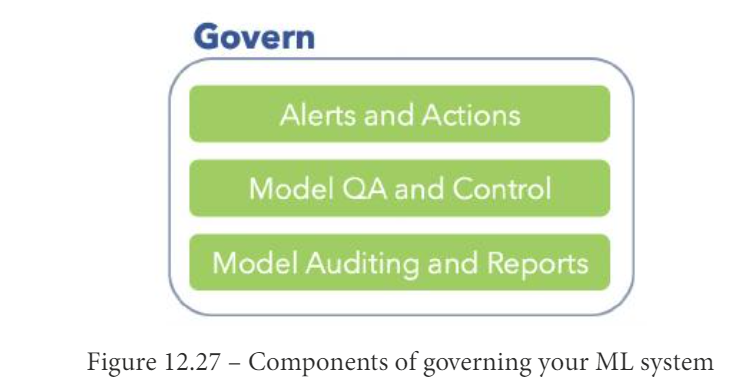

L'efficacité d'un système de ML peut être déterminée en utilisant des actions intelligentes qui sont prises en fonction de la surveillance et des alertes. Dans le chapitre suivant, nous explorerons la gouvernance du système de ML en termes d'alertes et d'actions, d'assurance qualité et de contrôle des modèles, et d'audit et de rapports des modèles.

## Résumé
Dans ce chapitre, nous avons découvert les principes clés pour proposer des modèles de ML à nos utilisateurs et les surveiller pour maximiser la valeur commerciale. Nous avons exploré les différents moyens de servir des modèles de ML aux utilisateurs ou aux consommateurs du modèle et mis en œuvre le cadre de surveillance explicable pour un cas d'utilisation métier hypothétique et déployé un modèle. Nous avons effectué cette mise en œuvre pratique d'un cadre de surveillance explicable pour mesurer les performances des systèmes de ML. Enfin, nous avons discuté de la nécessité de gouverner les systèmes de ML pour assurer la performance robuste des systèmes de ML. Nous explorerons plus en détail la gouvernance des systèmes de ML et les concepts d'apprentissage continu dans le prochain et dernier chapitre !